# Perkenalan

===================================================================================================================

Graded Challenge 7

Nama  : Ciputra Wangsa

Batch : HCK - 020

Program ini dibuat untuk melakukan prediksi suatu gambar kedalam suatu klasifikasi menggunakan CNN. Dataset gambar yang digunakan adalah bentuk wajah dengan jumlah 5 klasifikasi bentuk wajah. Dataset ini akan diuji menggunakan base model, model improvement berdasarkan insight evaluasi base model, dan model dengan transfer learning. Setelah model bisa melakukan prediksi bentuk wajah dengan tepat, selanjutnya akan diberikan rekomendasi bentuk kacamata yang sesuai dengan bentuk wajah tersebut.

===================================================================================================================

# Pendahuluan

## Topik Permasalahan

Banyak orang kesulitan memilih kacamata yang tepat karena tidak mempertimbangkan bentuk wajah.

## Latar Belakang Masalah

Pemilihan kacamata yang tepat sering kali menjadi tantangan bagi banyak orang karena kacamata tidak hanya mempengaruhi penglihatan, tetapi juga penampilan. Bentuk wajah yang berbeda membutuhkan jenis kacamata yang berbeda agar terlihat proporsional dan dapat menonjolkan fitur wajah. Namun, sebagian besar orang tidak memiliki pengetahuan yang cukup tentang kacamata yang cocok untuk bentuk wajah mereka, yang akhirnya dapat mengurangi kepercayaan diri. Sehingga diperlukan solusi untuk dapat membantu memilih kacamata sesuai dengan bentuk wajah untuk meningkatkan penampilan dan kepercayaan diri agar customer merasa puas dan bisa meningkatkan penjualan.

## Problem Statement (STAR Framework)

**Specific:**
Membantu pelanggan memilih kacamata yang tepat berdasarkan bentuk wajah mereka. Sehingga bisa meningkatkan penampilan, kepercayaan diri, kepuasan pelanggan, dan penjualan toko.

**Measurable:** Keberhasilan akan diukur melalui akurasi minimal 80% dalam pengenalan bentuk wajah, peningkatan kepuasan pelanggan hingga 80% terhadap rekomendasi kacamata yang dapat diperoleh melalui survei atau ulasan setelah penggunaan layanan, dan peningkatan revenue sebesar 20%.

**Achievable:** Solusi ini dapat dicapai dengan mengembangkan model CNN yang terlatih menggunakan dataset bentuk wajah, dan menerapkannya ke sistem toko eyewear untuk memberikan rekomendasi kacamata yang sesuai dengan pelanggan.

**Relevant:** Pengembangan model computer vision berbasis CNN relevan karena bisa membantu pelanggan dalam memilih kacamata yang sesuai dengan bentuk wajah mereka, meningkatkan kepuasan pelanggan, dan secara langsung berdampak pada peningkatan penjualan bagi toko eyewear dengan memberikan pengalaman belanja yang lebih personal dan efisien.

**Time-Bond:** Pengembangan, pelatihan, dan penerapan model ini akan diselesaikan dalam waktu 2 bulan.

**Problem Statement:**
Mengembangkan model CNN untuk membantu pelanggan memilih kacamata yang tepat berdasarkan bentuk wajah mereka, dengan target akurasi pengenalan 80% dan peningkatan kepuasan pelanggan hingga 80%, serta meningkatkan revenue toko sebesar 20% dalam waktu 2 bulan.

## Rumusan Masalah

1. Bagaimana contoh gambar dari masing-masing klasifikasi bentuk wajah dalam pelatihan model?
2. Bagaimana proporsi dataset dari masing-masing klasifikasi bentuk wajah?
3. Jelaskan deskripsi dan rekomendasi kacamata dari masing-masing klasifikasi bentuk wajah!

# Import Libraries

In [23]:
# path manipulation
import os

# data manipulation
import numpy as np
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

# modelling
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from keras.applications.vgg16 import VGG16, preprocess_input

# evaluation
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# ignore warning
import warnings
warnings.filterwarnings('ignore')

# Data Loading

Pada bagian ini berisi informasi sumber dataset, melakukan import dataset, dan deskripsi jumlah dataset per class.

## Source Dataset

Dataset didapatkan dari Kaggle:

https://www.kaggle.com/datasets/niten19/face-shape-dataset

## Import Dataset

In [2]:
# menyimpan dataset training ke dalam variabel
train_path = "/Users/ciputrawangsa/Documents/FaceShape/training_set"

# menyimpan dataset testing ke dalam variabel
test_path = "/Users/ciputrawangsa/Documents/FaceShape/testing_set"

## Jumlah Dataset Training dan Testing

In [3]:
def check_path(path):
  '''
  Fungsi ini dibuat untuk menampilkan jumlah data yang ada di dalam dataset training dan testing
  '''
  labels = os.listdir(path)
  for label in labels:
    if os.path.isdir(os.path.join(path, label)):
      num_data = len(os.listdir(os.path.join(path, label)))
      print(f'Total Data - {label} : {num_data}')

# menampilkan jumlah dataset training
print('Training Dataset')
check_path(train_path)
print('')

# menampilkan jumlah dataset testing
print('Testing Dataset')
check_path(test_path)
print('')

Training Dataset
Total Data - Oblong : 800
Total Data - Heart : 800
Total Data - Square : 800
Total Data - Oval : 800
Total Data - Round : 800

Testing Dataset
Total Data - Oblong : 200
Total Data - Heart : 200
Total Data - Square : 200
Total Data - Oval : 200
Total Data - Round : 200



Dari output diatas didapatkan informasi bahwa jumlah gambar per kategori adalah sama baik didalam dataset training maupun testing.

# Exploratory Data Analysis (EDA)

## Gambaran Dataset per Masing-masing Class

Pada bagian ini berisi tampilan gambar per masing-masing kategori, pie chart proporsi jumlah data per kategori dalam dataset training dan testing, analisa dan rekomendasi kacamata berdasarkan bentuk wajah.

In [4]:
def plot_images(path):
  '''
  Fungsi ini dibuat untuk menampilkan gambar yang ada didalam dataset training dan testing per masing-masing class
  '''
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    if os.path.isdir(folder_path):
      fig = plt.figure(figsize=(20, 20))
      columns = 5
      rows = 1
      print('Class : ', label)
      images = os.listdir(folder_path)
      for index in range(1, columns*rows +1):
          fig.add_subplot(rows, columns, index)
          image = plt.imread(os.path.join(folder_path, images[index]))
          plt.imshow(image)
          plt.axis("off")
      plt.show()

### Dataset Training

Class :  Oblong


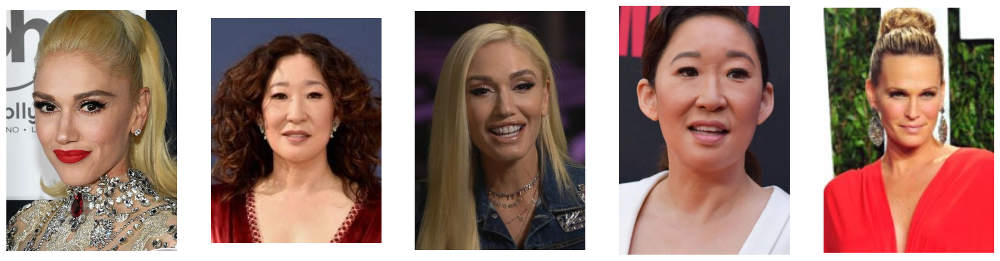

Class :  Heart


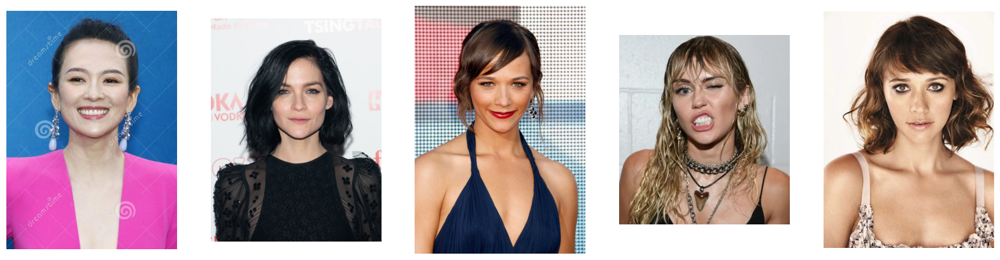

Class :  Square


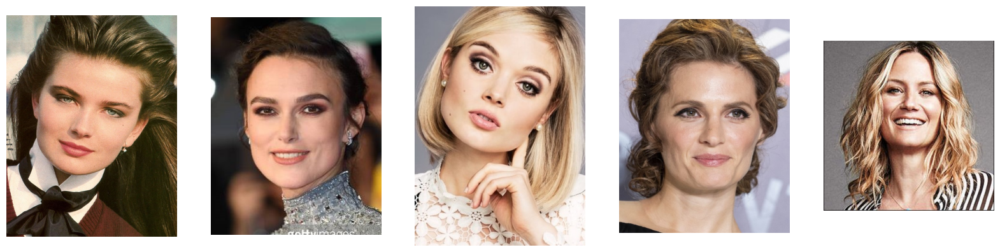

Class :  Oval


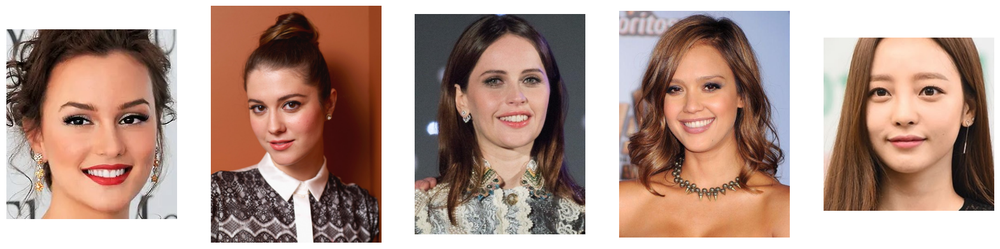

Class :  Round


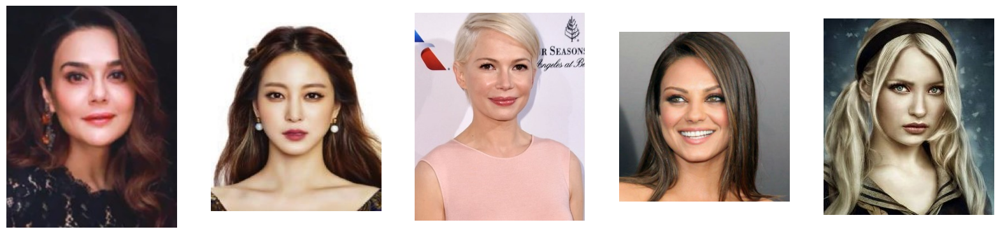

In [5]:
# menampilkan gambar dataset training
plot_images(train_path)

### Dataset Testing

Class :  Oblong


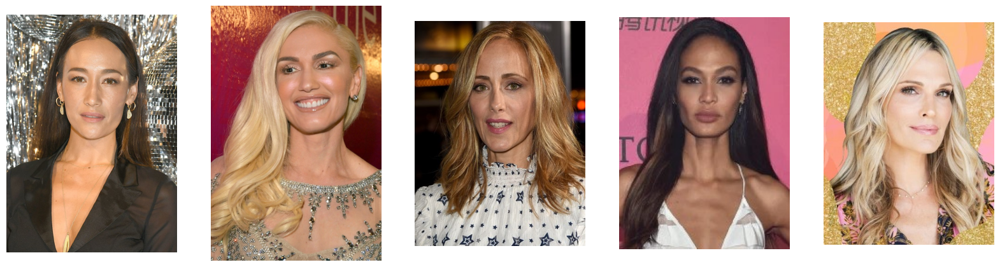

Class :  Heart


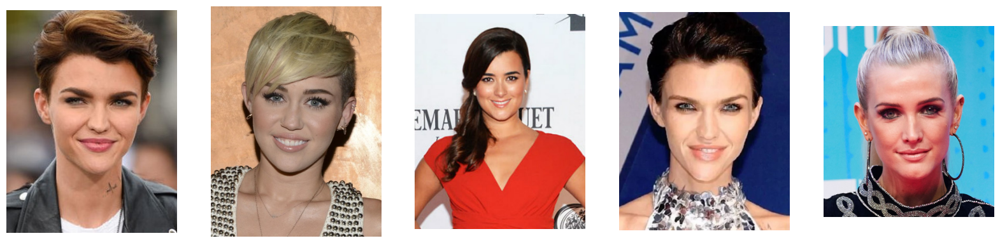

Class :  Square


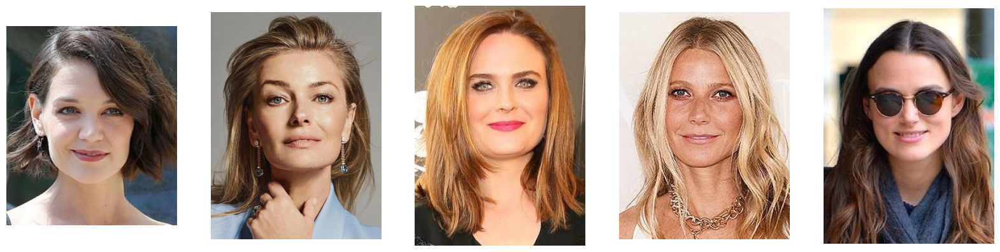

Class :  Oval


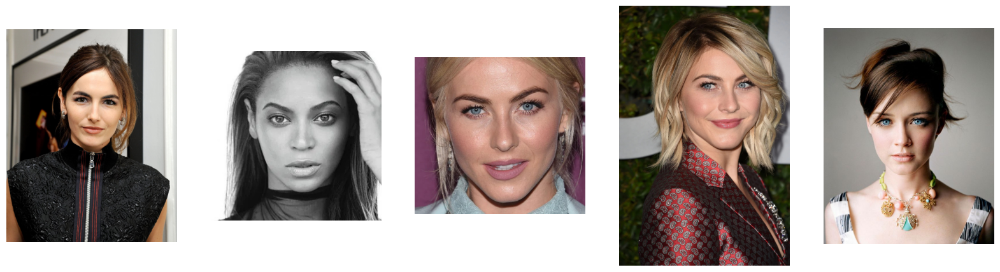

Class :  Round


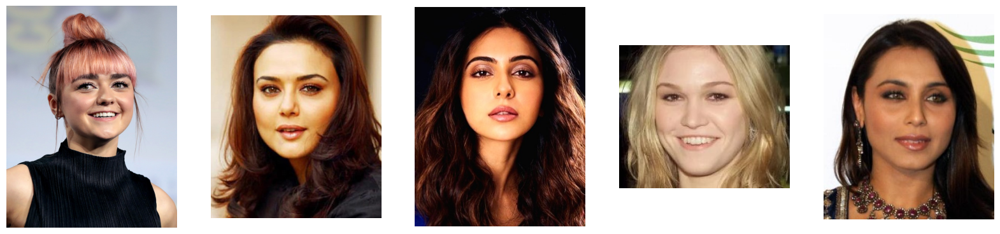

In [6]:
# menampilkan gambar dataset training
plot_images(test_path)

## Proporsi Masing-masing Class pada Dataset

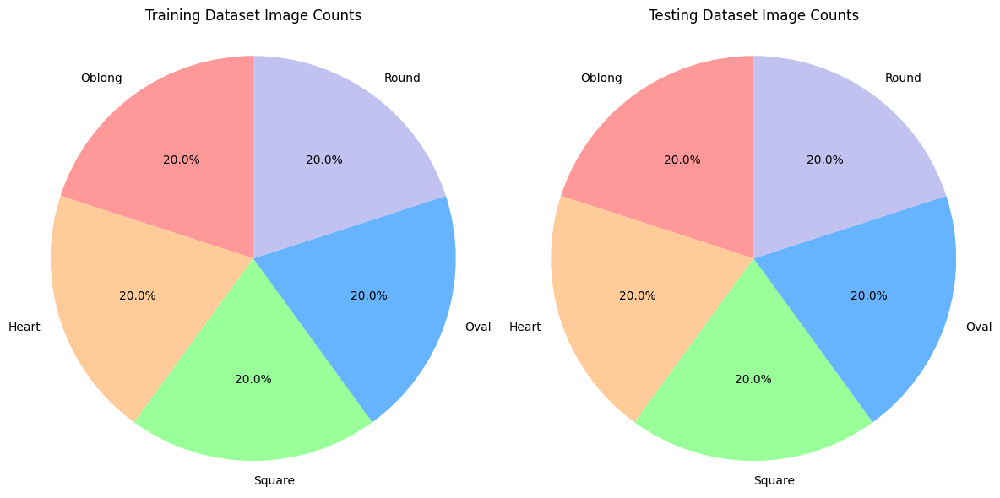

In [7]:
def group_and_count_images(path):
    '''
    Fungsi ini dibuat untuk melakukan grouping dan menjumlahkan data per class yang ada pada dataset training dan testing
    '''
    category_counts = {}
    # looping data per kategori di dalam folder utama
    for category in os.listdir(path):
        category_path = os.path.join(path, category)

        # cek per kategori
        if os.path.isdir(category_path):
            # listing file gambar 
            image_files = os.listdir(category_path)

            # menjumlahkan total gambar
            category_counts[category] = len(image_files)

    return category_counts

# menyimpan jumlah data gambar di dataset training
train_image_counts = group_and_count_images(train_path)

# menyimpan jumlah data gambar di dataset testing
test_image_counts = group_and_count_images(test_path)

# mendefinisikan warna per kategori
colors = {
    'Oblong': '#ff9999',  # Light red
    'Oval': '#66b3ff',    # Light blue
    'Square': '#99ff99',  # Light green
    'Heart': '#ffcc99',   # Light orange
    'Round': '#c2c2f0'    # Light purple
}

def plot_side_by_side_pie_charts(train_data, test_data):
    '''
    Fungsi ini digunakan untuk membuat pie chart komposisi data per kategori yang ada dalam dataset training dan testing
    '''
    # labeling kategori dataset training
    labels_train = list(train_data.keys())

    # listing jumlah gambar per kategori di dataset training
    sizes_train = list(train_data.values())

    # labeling kategori dataset testing
    labels_test = list(test_data.keys())

    # listing jumlah gambar per kategori di dataset testing
    sizes_test = list(test_data.values())  

    # menyesuaikan warna per kategori
    train_colors = [colors[label] for label in labels_train]
    test_colors = [colors[label] for label in labels_test]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Pie chart dataset training
    ax1.pie(sizes_train, labels=labels_train, colors=train_colors, autopct='%1.1f%%', startangle=90)
    ax1.set_title('Training Dataset Image Counts')
    ax1.axis('equal')

    # Pie chart dataset testing
    ax2.pie(sizes_test, labels=labels_test, colors=test_colors, autopct='%1.1f%%', startangle=90)
    ax2.set_title('Testing Dataset Image Counts')
    ax2.axis('equal')

    # menampilkan chart
    plt.tight_layout()
    plt.show()

# menampilkan pie chart proporsi data per kategori di dataset training dan testing
plot_side_by_side_pie_charts(train_image_counts, test_image_counts)


Dari pie chart diatas didapatkan informasi bahwa masing-masing class baik dari dataset training dan testing proporsinya sama

## Analisa dan Rekomendasi Kacamata Per Masing-masing Bentuk Wajah

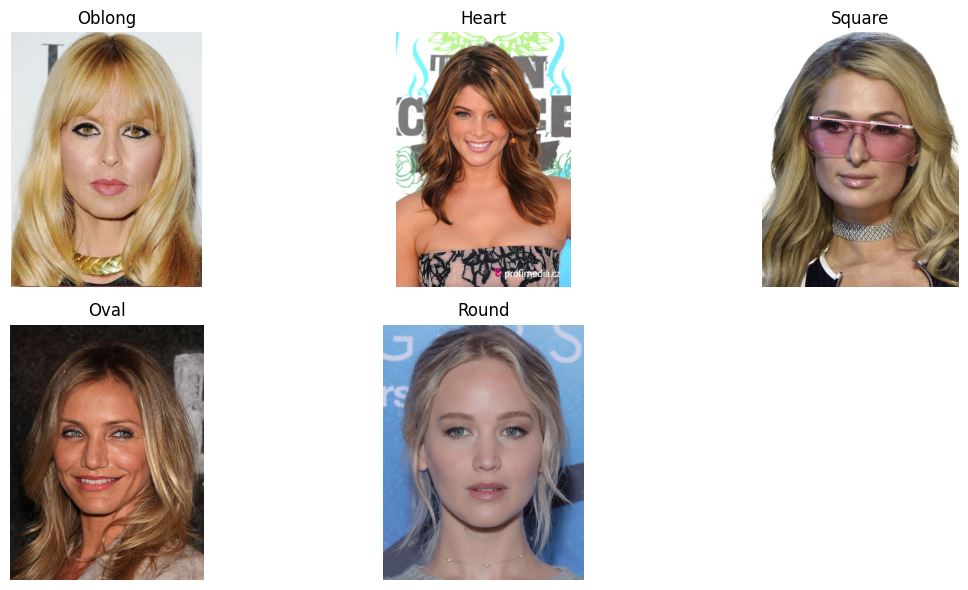

In [22]:
def get_one_image_per_category(path):
    '''
    Fungsi ini mengambil satu gambar dari setiap kategori dalam dataset
    '''
    category_images = {}
    for category in os.listdir(path):
        category_path = os.path.join(path, category)

        # cek per kategori
        if os.path.isdir(category_path):
            # listing file gambar 
            image_files = os.listdir(category_path)

            # ambil satu gambar per kategori
            if image_files:
                category_images[category] = os.path.join(category_path, image_files[0])

    return category_images

def display_images(image_dict):
    '''
    Fungsi ini digunakan untuk menampilkan gambar-gambar dari setiap kategori
    '''
    plt.figure(figsize=(12, 6))

    for i, (category, image_path) in enumerate(image_dict.items()):
        img = mpimg.imread(image_path)
        plt.subplot(2, (len(image_dict) + 1) // 2, i + 1)  # Menyusun gambar dalam beberapa baris
        plt.imshow(img)
        plt.title(category)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Mendapatkan satu gambar dari setiap kategori di dataset training
sample_images = get_one_image_per_category(train_path)

# Menampilkan gambar-gambar tersebut
display_images(sample_images)


Analisa dan rekomendasi:

1. Oblong (Panjang): Wajah panjang dan sempit.

    Rekomendasi Kacamata: Pilih kacamata dengan bingkai besar dan tebal yang memperlebar wajah, seperti model wayfarer atau kacamata bulat.

2. Heart (Hati): Dagu runcing, dahi lebih lebar.
    
    Rekomendasi Kacamata: Bingkai cat-eye atau kacamata tanpa bingkai yang lebih lebar di bagian bawah membantu menyeimbangkan proporsi wajah.

3. Square (Persegi): Rahang kuat, dahi dan dagu lebar.

    Rekomendasi Kacamata: Pilih bingkai bulat atau oval untuk melunakkan garis rahang yang tegas, menghindari bingkai kotak.

4. Oval: Proporsi wajah seimbang
    
    Rekomendasi Kacamata: Hampir semua gaya kacamata cocok, termasuk model persegi atau bulat, asalkan sesuai dengan ukuran wajah.

5. Round (Bulat): Wajah penuh dan melingkar.

    Rekomendasi Kacamata: Kacamata berbentuk persegi atau persegi panjang untuk memberikan definisi dan membuat wajah terlihat lebih ramping.

# Feature Engineering CNN Base Model

In [8]:
# menentukan ukuran image dan batch size
img_height = 224
img_width = 224
batch_size = 32

# preprocessing gambar
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                validation_split=0.3)

# define train set
train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=10)

# define validation set
val_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='validation',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=10)

# preprocessing gambar
test_datagen =tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# define test set
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=10)

Found 2800 images belonging to 5 classes.
Found 1200 images belonging to 5 classes.
Found 999 images belonging to 5 classes.


- Ukuran gambar dan batch size:

    Gambar diubah ukurannya menjadi 224x224 piksel dengan batch size sebesar 32. Ukuran gambar dan batch size ini adalah ukuran untuk model berbasis deep learning, seperti CNN, agar dapat menjaga ukuran memori tetap efisien tanpa mengurangi terlalu banyak detail visual.

- Preprocessing gambar:

    Gambar akan di-rescale ke dalam rentang nilai antara 0 dan 1 (sebelumnya 0 hingga 255) dengan membagi setiap piksel dengan 255 menggunakan parameter rescale=1./255.. Ini membantu model konvergen lebih cepat, karena jaringan saraf umumnya bekerja lebih baik dengan input skala kecil. Validation_split=0.3 digunakan untuk membagi dataset menjadi set pelatihan dan validasi dengan 70% data digunakan untuk pelatihan dan 30% untuk validasi.

- Train set, validation set, test set:
    
    Train set dan validation set dihasilkan menggunakan train datagen (preprocessing gambar sebelumnya), ukurannya juga diubah sesuai dengan target size (224x224), parameter shuffle=True memastikan bahwa gambar diacak setiap epoch, yang membantu model mempelajari fitur lebih baik dari data tanpa urutan tertentu. Untuk test set hampir sama hanya parameter shuffle dibuat False. Masing-masing dataset labelnya dikategorikan dengan metode sparse (dimana label dikodekan sebagai bilangan bulat)

In [24]:
# membuat variabel untuk menampung key dan value kelas dataset train
trac = train_set.class_indices

# membuat variabel untuk menampung key dan value kelas dataset validation
valc = val_set.class_indices

# membuat variabel untuk menampung key dan value kelas dataset test
tesc = test_set.class_indices

#menampilkan class dataset train
print(f'Class pada train set:\n{trac}\n')

#menampilkan class dataset validation
print(f'Class pada validation set:\n{valc}\n')

#menampilkan class dataset test
print(f'Class pada test set:\n{tesc}')

Class pada train set:
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}

Class pada validation set:
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}

Class pada test set:
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}


Dari output didapatkan informasi bahwa masing-masing dataset memiliki class yang sama.

# CNN Base Model with Sequential API

## CNN Base Model Definition

In [10]:
# clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# define model
model = Sequential()

# add layer
model.add(Conv2D(32, (3, 3), padding='same', strides=(1,1), activation='relu', input_shape=(img_height, img_width,3)))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.1, seed=seed))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.1, seed=seed))
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.1, seed=seed))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(5, activation='softmax'))

# compile model
model.compile(optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

# menampilkan summary architecture model
model.summary()

2024-10-06 21:37:56.846316: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-10-06 21:37:56.846351: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2024-10-06 21:37:56.846363: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2024-10-06 21:37:56.846401: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-10-06 21:37:56.846420: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 112, 112, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 55, 55, 64)        0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 55, 55, 64)        0

**Layer:**
- Layer pertama adalah konvolusi dengan 32 filter berukuran 3x3, padding 'same' agar ukuran frame tetap sama, dan fungsi aktivasi ReLU sesuai dengan activation function yang seharusnya digunakan. Ini adalah layer konvolusi yang mendeteksi fitur visual awal dari gambar input berukuran (224, 224, 3). Strides: (1,1) artinya filter bergeser satu piksel untuk setiap langkah.
- Layer kedua adalah konvolusi dengan 64 filter dan kernel 3x3, tanpa padding, diikuti dengan pooling dan dropout.
- Layer ketiga adalah konvolusi dengan 128 filter dan padding 'same'

**MaxPooling2D:**

Setelah setiap konvolusi, digunakan MaxPooling2D berukuran 2x2 untuk mengurangi dimensi, dari (224,224) menjadi (112,112) pada layer pertama, dan seterusnya pada layer berikutnya. Hal ini dilakukan untuk mengurangi kompleksitas komputasi dan overfitting.

**Dropout:**

Dropout dengan rate 0.1 digunakan setelah setiap pooling layer. Digunakan untuk mencegah overfitting dengan secara acak mematikan 10% neuron selama pelatihan, agar membuat model lebih bisa mengeneralisasi.

**Flatten:**

Flatten mengubah output tiga dimensi dari layer konvolusi menjadi vektor satu dimensi, sebelum digunakan untuk proses fully connected layer.

**Fully Connected Layer (Dense):**

Layer Dense pertama memiliki 512 unit dengan activation function ReLU sesuai dengan yang seharusnya.Dropout dengan rate 0.5 digunakan untuk mencegah overfitting pada layer ini. Layer Dense terakhir memiliki 5 unit dengan aktivasi softmax yang menghasilkan probabilitas untuk setiap dari 5 kelas yang ditargetkan.

**Hyperparameter:**

Optimizer: Adam, yang adaptif dan secara otomatis mengatur learning rate dan paling sering digunakan.
Loss Function: sparse_categorical_crossentropy, digunakan untuk klasifikasi multi-kelas dengan label integer.
Metrics: Akurasi digunakan sebagai metrik evaluasi. Karena akan fokus pada akurasi dalam proses classification

## CNN Base Model Training

In [14]:
# training model
history = model.fit(train_set,
                    validation_data=val_set,
                    epochs=25,
                    batch_size=batch_size)

Epoch 1/25


2024-10-05 14:56:32.173501: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


22/22 [==============================] - ETA: 0s - loss: 6.5589 - accuracy: 0.2161

2024-10-05 14:56:41.094353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


22/22 [==============================] - 12s 478ms/step - loss: 6.5589 - accuracy: 0.2161 - val_loss: 1.6094 - val_accuracy: 0.2133
Epoch 2/25
22/22 [==============================] - 10s 449ms/step - loss: 1.6102 - accuracy: 0.2211 - val_loss: 1.6094 - val_accuracy: 0.1992
Epoch 3/25
22/22 [==============================] - 10s 450ms/step - loss: 1.6092 - accuracy: 0.2086 - val_loss: 1.6095 - val_accuracy: 0.1983
Epoch 4/25
22/22 [==============================] - 10s 443ms/step - loss: 1.6073 - accuracy: 0.2175 - val_loss: 1.6087 - val_accuracy: 0.2050
Epoch 5/25
22/22 [==============================] - 10s 465ms/step - loss: 1.5886 - accuracy: 0.2571 - val_loss: 1.5841 - val_accuracy: 0.2742
Epoch 6/25
22/22 [==============================] - 10s 465ms/step - loss: 1.5538 - accuracy: 0.3125 - val_loss: 1.5807 - val_accuracy: 0.2808
Epoch 7/25
22/22 [==============================] - 11s 476ms/step - loss: 1.5064 - accuracy: 0.3511 - val_loss: 1.5708 - val_accuracy: 0.3008
Epoch 8/25

Setelah training model dengan menjalankan 25 epoch, didapatkan insight dan rekomendasi berikut:

Insight:
- Nilai loss meningkat secara drastis baik pada training ataupun validation set
- Pada epoch 1 hingga 5, terlihat bahwa nilai loss dan accuracy masih stabil. Namun, setelah epoch 12, loss mulai meningkat tajam, dan di epoch-epoch selanjutnya, loss semakin memburuk hingga mencapai nilai yang sangat besar
- Nilai accuracy meningkat sedikit di awal, namun setelah epoch 18 nilainya menurun dan tidak stabil. Validation accuracy tetap stagnan di kisaran 27-31%, sementara validation loss melonjak, mengindikasikan model tidak mampu mengeneralisasi data dengan baik.

Dugaan dan rekomendasi:
- Learning rate yang terlalu tinggi, sehingga nanti akan dicoba tuning
- Ada masalah pada data preprocessing atau penentuan layer, sehingga nanti akan dicoba tuning ulang

## CNN Base Model Architecture Plot

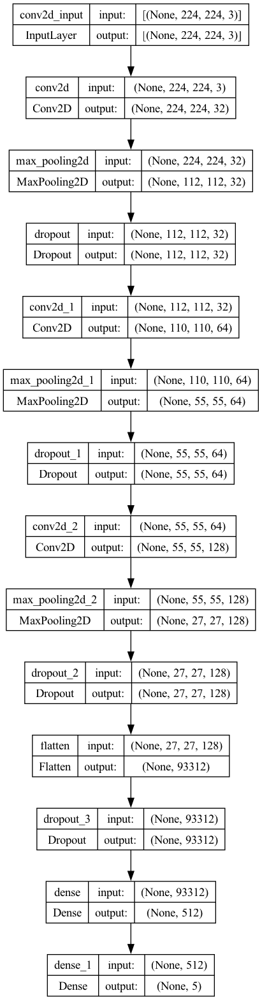

In [11]:
# membuat plot architecture model CNN tanpa tuning
tf.keras.utils.plot_model(model, show_shapes=True)

## CNN Base Model Evaluation

### CNN Base Model Loss & Accuracy Plot

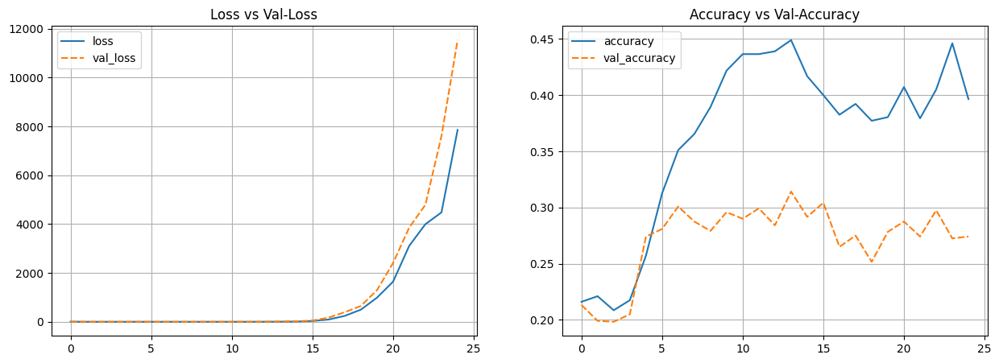

In [15]:
# Plot training results
history_df = pd.DataFrame(history.history)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show()

Hasil plot mendukung insight dari permasalahan sebelumnya, jika dijelaskan menggunakan plot diatas didapatkan insight dan rekomendasi seperti berikut:

Insight:
- Setelah epoch ke-15, terjadi peningkatan signifikan pada nilai loss baik di training maupun validation set, yang mengindikasikan exploding gradient problem. Hal ini memperparah performa model seiring bertambahnya epoch.
- Pada grafik akurasi, akurasi validation set cenderung stagnan dan tidak meningkat, meskipun akurasi training meningkat secara signifikan. Ini menunjukkan adanya overfitting. Model belajar terlalu baik pada data training tapi gagal untuk generalisasi pada data validation.
- Terjadi gap antara training accuracy yang meningkat hingga 0.45, sedangkan validation accuracy tetap sekitar 0.28-0.30. Ini juga menandakan bahwa model mengalami overfitting.

Rekomendasi:
- Mencoba untuk menurunkan learning rate
- Meningkatkan nilai dropout
- menggunakan regularisasi L2

## CNN Base Model Predict

### CNN Base Model Classification Report Evaluation

In [12]:
# predict test set
y_pred_prob = model.predict(test_set)

# mengklasifikasikan class berdasarkan nilai proba terbesar
y_pred_class = np.argmax(y_pred_prob, axis=-1)

# menampilkan classification report
print(classification_report(test_set.classes, y_pred_class, target_names=np.array(list(train_set.class_indices.keys()))))

 1/32 [..............................] - ETA: 5s

2024-10-06 21:38:15.760422: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 2s 73ms/step
              precision    recall  f1-score   support

       Heart       0.00      0.00      0.00       200
      Oblong       0.25      0.06      0.10       200
        Oval       0.12      0.01      0.03       200
       Round       0.20      0.86      0.32       199
      Square       0.20      0.07      0.10       200

    accuracy                           0.20       999
   macro avg       0.15      0.20      0.11       999
weighted avg       0.15      0.20      0.11       999



Dari classification report hasilnya juga tidak optimal dari proses training model yang dilakukan, insight dan rekomendasinya seperti berikut:

Insight:
- Untuk kelas Heart dan Oval yang tidak terprediksi sama sekali
- Model lebih banyak memprediksi class Round (recall 0.86)
- Akurasi keseluruhan hanya 0.20, yang menunjukkan model belum mampu belajar dengan baik.

Rekomendasi:
- Menambah data augmentation untuk meningkatkan variasi data.
- Melakukan tuning hyperparameter seperti learning rate, jumlah filter di Conv2D, atau penggunaan regularization lebih baik.

### CNN Base Model Confusion Matrix Evaluation

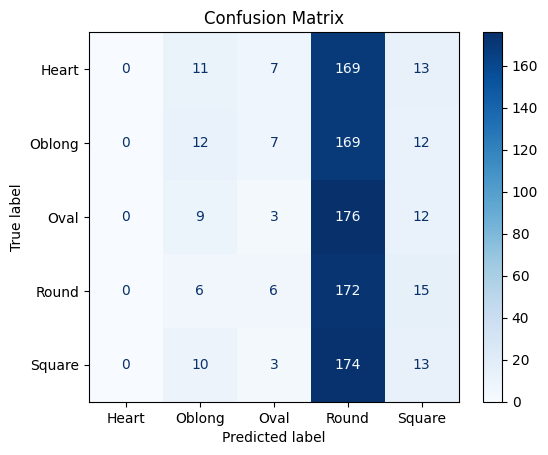

In [13]:
# mendapatkan label asli dari dataset test
y_true_labels = test_set.classes

# membuat confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_class)

# menampilkan confusion matrix dalam bentuk plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set.class_indices.keys())
disp.plot(cmap=plt.cm.Blues)

# menampilkan plot
plt.title('Confusion Matrix')
plt.show()


Jika dilihat dari confusion matrix, hasilnya lebih jelas jika dibandingkan dengan classification report, adapun insight dan rekomendasinya seperti berikut:

Insight:
- Banyak prediksi yang diarahkan ke kategori Round. Ini menunjukkan bahwa model terlalu sering menganggap input sebagai bentuk wajah Round
- Tidak ada prediksi yang benar untuk kelas "Heart", dan kebanyakan salah diprediksi sebagai "Round". Ini bisa mengindikasikan bahwa fitur kelas "Heart" sulit dibedakan oleh model.
- Selain kelas "Round", model juga tampak kesulitan membedakan kategori-kategori lainnya.

Rekomendasi:
- Melakukan tuning hyperparameter seperti learning rate, jumlah filter di Conv2D, atau penggunaan regularization lebih baik.

# Feature Engineering CNN Model Improvement

In [15]:
# menentukan ukuran image dan batch size
img_height = 224
img_width = 224
batch_size = 32

# preprocessing gambar
train_datagen_imp = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                    rotation_range=20,
                                                                    zoom_range=0.4,
                                                                    horizontal_flip=True,
                                                                    vertical_flip=True,
                                                                    validation_split=0.3)

# define train set model dengan data augmentation
train_set_imp = train_datagen_imp.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=10)

# define validation set model dengan data augmentation
val_set_imp = train_datagen_imp.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='validation',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=10)

# preprocessing gambar
test_datagen_imp =tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# define test set model dengan data augmentation
test_set_imp = test_datagen_imp.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=10)

Found 2800 images belonging to 5 classes.
Found 1200 images belonging to 5 classes.
Found 999 images belonging to 5 classes.


Setelah mendapatkan insight dari model sebelumnya, perubahan hanya dilakukan pada saat preprocessing image dengan menambahkan data augmentation:
- rotation_range=20
- zoom_range=0.4
- horizontal_flip=True
- vertical_flip=True

# CNN Model Improvement

## CNN Model Improvement Definition

In [18]:
# Clear session
seed = 10
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# define model
model_imp = Sequential()

# add layer
model_imp.add(Conv2D(32, (3, 3), padding='same', strides=(1,1), kernel_regularizer=l2(0.05), activation='relu', input_shape=(img_height, img_width,3)))
model_imp.add(BatchNormalization())
model_imp.add(MaxPooling2D((2, 2)))
model_imp.add(Dropout(0.1, seed=seed))
model_imp.add(Conv2D(64, (3, 3), kernel_regularizer=l2(0.01), activation='relu'))
model_imp.add(BatchNormalization())
model_imp.add(MaxPooling2D((2, 2)))
model_imp.add(Dropout(0.1, seed=seed))
model_imp.add(Conv2D(128, (5, 5), padding='same', activation='relu'))
model_imp.add(BatchNormalization())
model_imp.add(MaxPooling2D((2, 2)))
model_imp.add(Dropout(0.1, seed=seed))
model_imp.add(Flatten())
model_imp.add(Dropout(0.5))
model_imp.add(Dense(512, activation='relu'))
model_imp.add(Dense(5, activation='softmax'))

# compile model
model_imp.compile(optimizer=Adam(learning_rate=0.00001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy'])

# menampilkan summary architecture model
model_imp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 224, 224, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 112, 112, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 64)      18496     
                                                                 
 batch_normalization_1 (Bat  (None, 110, 110, 64)      2

Setelah mendapatkan insight dari model sebelumnya, pada model improvement dilakukan percobaan dengantuning learning rate pada optimizer Adam, melakukan regularisasi pada 2 layer. Untuk jumlah layer dan filter masih disamakan.

In [16]:
# membuat variabel untuk menampung key dan value kelas dataset train
trac_imp = train_set_imp.class_indices

# membuat variabel untuk menampung key dan value kelas dataset validation
valc_imp = val_set_imp.class_indices

# membuat variabel untuk menampung key dan value kelas dataset test
tesc_imp = test_set_imp.class_indices

#menampilkan class dataset train
print(f'Class pada train set:\n{trac_imp}\n')

#menampilkan class dataset validation
print(f'Class pada validation set:\n{valc_imp}\n')

#menampilkan class dataset test
print(f'Class pada test set:\n{tesc_imp}\n')

Class pada train set:
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}

Class pada validation set:
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}

Class pada test set:
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}



Pada dataset training, test dan validation untuk model improvement masih memiliki jumlah kelas yang seimbang dan sesuai.

## CNN Model Improvement Training

In [23]:
# training model dengan data augmentation
history_imp = model_imp.fit(
    train_set_imp,
    validation_data=val_set_imp,
    epochs=25
)

Epoch 1/25


2024-10-05 15:00:49.772256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


88/88 [==============================] - ETA: 0s - loss: 5.4690 - accuracy: 0.2679

2024-10-05 15:01:05.011986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


88/88 [==============================] - 18s 192ms/step - loss: 5.4690 - accuracy: 0.2679 - val_loss: 2.6932 - val_accuracy: 0.2808
Epoch 2/25
88/88 [==============================] - 15s 173ms/step - loss: 4.1690 - accuracy: 0.3375 - val_loss: 2.6489 - val_accuracy: 0.3392
Epoch 3/25
88/88 [==============================] - 16s 185ms/step - loss: 3.4894 - accuracy: 0.4096 - val_loss: 2.9355 - val_accuracy: 0.3542
Epoch 4/25
88/88 [==============================] - 15s 174ms/step - loss: 3.2618 - accuracy: 0.4275 - val_loss: 2.8471 - val_accuracy: 0.3483
Epoch 5/25
88/88 [==============================] - 15s 173ms/step - loss: 2.9782 - accuracy: 0.4632 - val_loss: 2.9658 - val_accuracy: 0.3517
Epoch 6/25
88/88 [==============================] - 15s 172ms/step - loss: 2.7535 - accuracy: 0.4839 - val_loss: 3.0835 - val_accuracy: 0.3575
Epoch 7/25
88/88 [==============================] - 15s 171ms/step - loss: 2.6743 - accuracy: 0.5107 - val_loss: 3.1826 - val_accuracy: 0.3550
Epoch 8/25

Dari hasil training dengan model yang dilakukan data augmentation dan tuning pada layer dan optimizer, didapatkan insight seperti berikut:

Insight:
- Pada epoch pertama, akurasi model mulai dari 26.79%. Namun, seiring berjalannya waktu, akurasi terus meningkat hingga mencapai 85.07% pada epoch ke-25. Ini menunjukkan bahwa model belajar dan beradaptasi dengan baik terhadap data training.
- Meskipun akurasi training meningkat, val_loss atau loss pada data validasi tidak menunjukkan perbaikan yang signifikan setelah beberapa epoch. Bahkan pada epoch akhir, val_loss mencapai 4.08, lebih tinggi dari nilai loss pada epoch sebelumnya.
- Akurasi pada data validasi mulai di sekitar 28.08% dan hanya mengalami sedikit peningkatan hingga mencapai sekitar 37.08% pada epoch terakhir. Meskipun ada fluktuasi, akurasi validasi tidak meningkat secara signifikan seiring dengan peningkatan akurasi training.
- Perbedaan yang signifikan antara akurasi training (85%) dan akurasi validasi (37%) menunjukkan adanya overfitting. Model terlalu fokus pada data training sehingga performanya menurun saat diuji pada data validasi yang tidak dilihat sebelumnya.

`Sebelumnya sudah dilakukan trial error pengujian model menggunakan beragam nilai dropout, learning rate, regularisasi, value data augmentation convert RGB ke YCBCR. Hasilnya masih overfit dan score val_accuracy sering berada di angka 0.20 - 0.28, dan akhirnya ditemukan score yang bisa dianggap lebih baik dari hasil uji coba sebelumnya namun bukan model yang terbaik, sehingga uji coba terakhir akan menggunakan transfer learning.`

## CNN Model Improvement Architecture Plot

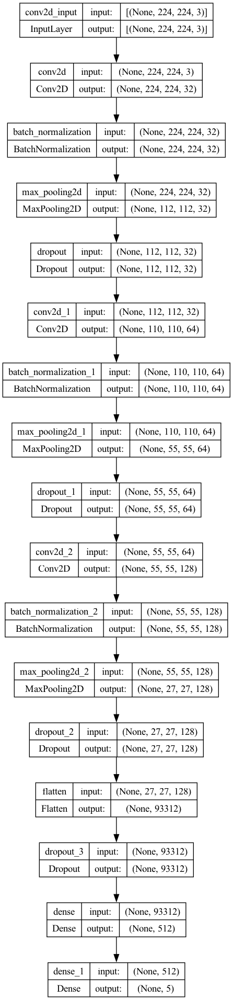

In [25]:
# menampilkan plot architecture model dengan data augmentation
tf.keras.utils.plot_model(model_imp, show_shapes=True)

## CNN Model Improvement Evaluation

### CNN Model Improvement Loss & Accuracy Plot

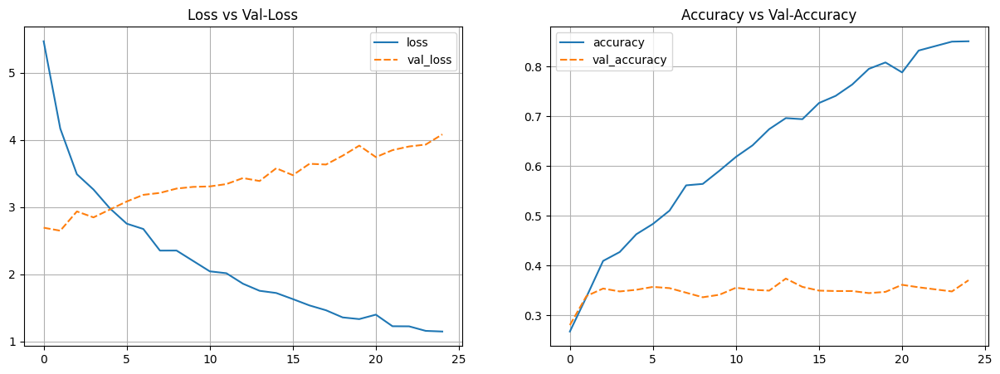

In [24]:
# Plot training results
history_df = pd.DataFrame(history_imp.history)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show()

Dari plot diatas didapatkan insight seperti berikut:
- Loss pada training set secara konsisten menurun, menunjukkan bahwa model terus belajar dari data training. Namun, val_loss (loss pada validation set) berhenti menurun setelah beberapa epoch dan bahkan cenderung naik setelah epoch ke-10. Hal ini mengindikasikan adanya overfitting, di mana model bekerja baik pada data training, tetapi tidak dapat generalisasi dengan baik pada data validasi.
- Akurasi training meningkat secara signifikan, dari sekitar 0.3 hingga mendekati 0.85 di epoch terakhir. Sebaliknya, akurasi validasi hampir datar, dengan hanya sedikit peningkatan dari sekitar 0.28 ke 0.37. Ini memperkuat indikasi bahwa model tidak generalisasi dengan baik pada data baru, meskipun performanya meningkat pada data training.

## CNN Model Improvement Predict

### CNN Model Improvement Classification Report Evaluation

In [19]:
# predict test set
y_pred_prob_imp = model_imp.predict(test_set_imp)

# mengklasifikasikan class berdasarkan nilai proba terbesar
y_pred_class_imp = np.argmax(y_pred_prob_imp, axis=-1)

# menampilkan classification report
print(classification_report(test_set_imp.classes, y_pred_class_imp, target_names=np.array(list(train_set_imp.class_indices.keys()))))

 1/32 [..............................] - ETA: 4s

2024-10-06 21:47:01.107553: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 3s 82ms/step
              precision    recall  f1-score   support

       Heart       0.18      0.65      0.28       200
      Oblong       0.00      0.00      0.00       200
        Oval       0.00      0.00      0.00       200
       Round       0.24      0.33      0.28       199
      Square       0.00      0.00      0.00       200

    accuracy                           0.20       999
   macro avg       0.08      0.20      0.11       999
weighted avg       0.08      0.20      0.11       999



Hasil classification report menunjukkan penurunan pada score accuracy, beberapa kali terjadi error pada laptop dan mengharuskan restart kernel, setelah direfresh hasilnya berubah, hasil accuracy yang pertama berada di angka 0.24 setelah direstart accuracy berubah menjadi 0.20. Hal ini masih menandakan bahwa model tidak mampu mengenali sebagian besar kelas dengan baik, khususnya pada kelas selain Heart. Model perlu di-tuning lebih lanjut, mungkin dengan penambahan data atau pengaturan ulang hyperparameter, untuk meningkatkan performa.

### CNN Model Improvement Confusion Matrix Evaluation

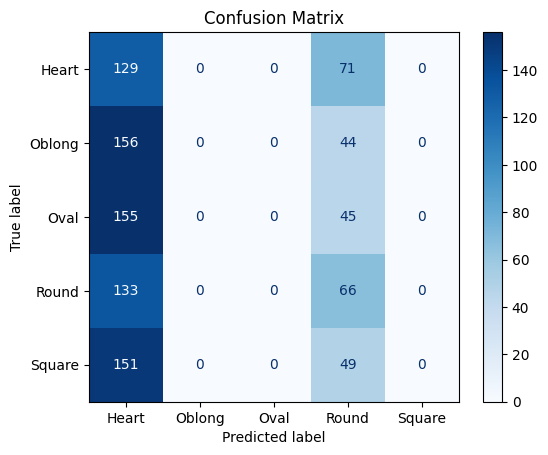

In [25]:
# mendapatkan label asli dari dataset test
y_true_labels = test_set_imp.classes

# membuat confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_class_imp)

# menampilkan confusion matrix dalam bentuk plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set_imp.class_indices.keys())
disp.plot(cmap=plt.cm.Blues) 

# menampilkan plot
plt.title('Confusion Matrix')
plt.show()

Jika dilihat dari confusion matrix, didapatkan insight:
- Sebagian besar gambar dengan label Heart diprediksi dengan benar (129/200), tetapi masih ada banyak gambar yang salah diklasifikasikan sebagai Round (71/200).
- Semua gambar dengan label Oblong, Oval, dan Square salah diklasifikasikan sebagai Heart. Hal ini menunjukkan bahwa model tidak mampu mengenali ketiga kelas tersebut sama sekali.
- Kelas Round memiliki distribusi prediksi yang lebih baik dibandingkan kelas lain selain Heart (66/199 prediksi benar), tetapi masih memiliki tingkat kesalahan yang signifikan.
- Model masih memiliki masalah signifikan dalam membedakan kelas, terutama untuk kelas Oblong, Oval, dan Square yang hampir seluruhnya salah diklasifikasikan. Ini menandakan perlunya peningkatan dalam hal pelatihan model, mungkin dengan menyeimbangkan data atau melakukan tuning pada parameter model

# Feature Engineering CNN Model Transfer Learning

Setelah melakukan trial error dan tidak mendapatkan hasil yang memuaskan akhirnya diputuskan untuk menggunakan transfer learning, model pre-trained yang digunakan adalah VGG16.

In [27]:
# menentukan ukuran image dan batch size
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE =32

# preprocessing gambar menggunakan preprocessing VGG16 dan menambah data augmentation
train_datagen_tl = ImageDataGenerator(preprocessing_function=preprocess_input,
                                      vertical_flip=True,
                                      horizontal_flip=True,
                                      rotation_range=30,
                                      width_shift_range=0.05,
                                      height_shift_range=0.05,
                                      shear_range=0.05,
                                      zoom_range=0.05,
                                      validation_split=0.1)

# define train set model dengan transfer learning
train_set_tl = train_datagen_tl.flow_from_directory(train_path,
                                              target_size=(IMG_HEIGHT,IMG_WIDTH),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=BATCH_SIZE,
                                              shuffle=True,
                                              seed=10)

# define validation set model dengan transfer learning
val_set_tl = train_datagen_tl.flow_from_directory(train_path,
                                              target_size=(IMG_HEIGHT,IMG_WIDTH),
                                              class_mode='sparse',
                                              subset='validation',
                                              batch_size=BATCH_SIZE,
                                              shuffle=True,
                                              seed=10)

# preprocessing gambar menggunakan preprocessing VGG16
test_datagen_tl = ImageDataGenerator(preprocessing_function=preprocess_input)

# define test set model dengan transfer learning
test_set_tl = test_datagen_tl.flow_from_directory(test_path,
                                            target_size=(IMG_HEIGHT,IMG_WIDTH),
                                            class_mode='sparse',
                                            batch_size=BATCH_SIZE,
                                            shuffle=False,
                                            seed=10)


Found 3600 images belonging to 5 classes.
Found 400 images belonging to 5 classes.
Found 999 images belonging to 5 classes.


Setelah mendapatkan insight dari model improvement menggunakan data augmentation sebelumnya, perubahan dilakukan pada preprocessing image dengan menambahkan data augmentation tambahan, size data validation dikurangin menjadi 0.1, dan menggunakan preprocess input dari model VGG16. Data augmentation menjadi:
- vertical_flip=True
- horizontal_flip=True
- rotation_range=30
- width_shift_range=0.05
- height_shift_range=0.05
- shear_range=0.05
- zoom_range=0.05

# CNN Model Transfer Learning with VGG16

## CNN Model Transfer Learning Definition

In [28]:
# load model VGG16 
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False

# clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# define model
x = Flatten()(base_model.output)
pred = Dense(5, activation='softmax')(x)
model_tl = Model(inputs=base_model.input, outputs=pred)

# melakukan freeze sampai 10 layer terakhir model VGG16, 10 layer terakhir diunfreeze
for layer in base_model.layers[-10:]:
    layer.trainable = True

# compile model
model_tl.compile(loss='sparse_categorical_crossentropy',
                 optimizer=Adam(learning_rate=0.00001),  # Smaller learning rate for fine-tuning
                 metrics=['accuracy'])

# menampilkan summary architecture model transfer learning
model_tl.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

Secara keseluruhan, kode ini memanfaatkan transfer learning dari model VGG16 yang sudah dilatih di dataset ImageNet. Lapisan fully connected terakhir dari VGG16 (yang digunakan untuk klasifikasi ImageNet) dihilangkan 'include_top=False', sehingga hanya mengambil convolutional layers untuk feature extraction. Kemudian dilakukan looping untuk layer pada agar tidak semua layer digunakan, tetapi hanya menggunakan 10 layer terakhir dari model VGG16 saja yang digunakan, yang berarti selama tahap awal, bobot dari layer-layer ini tidak akan diperbarui (di-freeze). sepuluh layer terakhir dari VGG16 di-unfreeze untuk disesuaikan dengan dataset baru yang spesifik, dan sebuah layer fully connected ditambahkan untuk mengklasifikasikan gambar ke dalam 5 kelas target. Model ini kemudian dilatih dengan learning rate rendah untuk melakukan fine-tuning. Optimizer masih menggunakan Adam dengan learning rate yang sangat kecil (learning_rate=0.00001). Ini penting untuk fine-tuning model pre-trained, karena learning rate yang terlalu besar bisa merusak bobot yang sudah dilatih dengan baik. Sebelumnya sudah dicoba menggunakan learning rate diatas learning rate yang digunakan, tetapi hasilnya masih belum memuaskan. Untuk loss function, metrics dan shape masih sama.

## CNN Model Transfer Learning Training

In [122]:
# training model dengan transfer learning
history_tl = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=30,
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl))

Epoch 1/30
113/113 [==============================] - 50s 445ms/step - loss: 1.5829 - accuracy: 0.2619 - val_loss: 1.5505 - val_accuracy: 0.3050
Epoch 2/30
113/113 [==============================] - 50s 445ms/step - loss: 1.5723 - accuracy: 0.2758 - val_loss: 1.5315 - val_accuracy: 0.2875
Epoch 3/30
113/113 [==============================] - 51s 449ms/step - loss: 1.5447 - accuracy: 0.2942 - val_loss: 1.5235 - val_accuracy: 0.2925
Epoch 4/30
113/113 [==============================] - 51s 450ms/step - loss: 1.5401 - accuracy: 0.2983 - val_loss: 1.5072 - val_accuracy: 0.3225
Epoch 5/30
113/113 [==============================] - 51s 446ms/step - loss: 1.5231 - accuracy: 0.3153 - val_loss: 1.4889 - val_accuracy: 0.3575
Epoch 6/30
 30/113 [======>.......................] - ETA: 4:47 - loss: 1.5125 - accuracy: 0.3136

Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Discarded (victim of GPU error/recovery) (00000005:kIOGPUCommandBufferCallbackErrorInnocentVictim)
	<AGXG15XFamilyCommandBuffer: 0x43fc41e40>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b985800>
        label = <none> 
        device = <AGXG15SDevice: 0x14b7abc00>
            name = Apple M3 Pro 
    retainedReferences = 1
Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Discarded (victim of GPU error/recovery) (00000005:kIOGPUCommandBufferCallbackErrorInnocentVictim)
	<AGXG15XFamilyCommandBuffer: 0x43fcc0fc0>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b

113/113 [==============================] - 139s 1s/step - loss: 1.5031 - accuracy: 0.3342 - val_loss: 1.4618 - val_accuracy: 0.3300
Epoch 7/30
113/113 [==============================] - 50s 443ms/step - loss: 1.4651 - accuracy: 0.3650 - val_loss: 1.3779 - val_accuracy: 0.3875
Epoch 8/30
113/113 [==============================] - 50s 444ms/step - loss: 1.4338 - accuracy: 0.3739 - val_loss: 1.4013 - val_accuracy: 0.3950
Epoch 9/30
113/113 [==============================] - 50s 445ms/step - loss: 1.4058 - accuracy: 0.3947 - val_loss: 1.3711 - val_accuracy: 0.4250
Epoch 10/30
113/113 [==============================] - 51s 447ms/step - loss: 1.3830 - accuracy: 0.4003 - val_loss: 1.3685 - val_accuracy: 0.4275
Epoch 11/30
113/113 [==============================] - 50s 444ms/step - loss: 1.3425 - accuracy: 0.4236 - val_loss: 1.3011 - val_accuracy: 0.4600
Epoch 12/30
113/113 [==============================] - 50s 444ms/step - loss: 1.3114 - accuracy: 0.4531 - val_loss: 1.2821 - val_accuracy: 0.

Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Caused GPU Hang Error (00000003:kIOGPUCommandBufferCallbackErrorHang)
	<AGXG15XFamilyCommandBuffer: 0x37d461a80>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b985800>
        label = <none> 
        device = <AGXG15SDevice: 0x14b7abc00>
            name = Apple M3 Pro 
    retainedReferences = 1
Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Discarded (victim of GPU error/recovery) (00000005:kIOGPUCommandBufferCallbackErrorInnocentVictim)
	<AGXG15XFamilyCommandBuffer: 0x37d4e72f0>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b985800>
        label = <none

113/113 [==============================] - 51s 446ms/step - loss: 1.0435 - accuracy: 0.5767 - val_loss: 1.1001 - val_accuracy: 0.5800
Epoch 21/30
113/113 [==============================] - 51s 446ms/step - loss: 1.0321 - accuracy: 0.5853 - val_loss: 1.0387 - val_accuracy: 0.5875
Epoch 22/30
 87/113 [======================>.......] - ETA: 10s - loss: 1.0013 - accuracy: 0.5932

Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Caused GPU Hang Error (00000003:kIOGPUCommandBufferCallbackErrorHang)
	<AGXG15XFamilyCommandBuffer: 0x30803b8f0>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b985800>
        label = <none> 
        device = <AGXG15SDevice: 0x14b7abc00>
            name = Apple M3 Pro 
    retainedReferences = 1


113/113 [==============================] - 51s 450ms/step - loss: 0.9986 - accuracy: 0.5961 - val_loss: 1.0330 - val_accuracy: 0.5850
Epoch 23/30
113/113 [==============================] - 52s 455ms/step - loss: 0.9564 - accuracy: 0.6153 - val_loss: 1.0423 - val_accuracy: 0.6100
Epoch 24/30
113/113 [==============================] - 51s 453ms/step - loss: 0.9231 - accuracy: 0.6392 - val_loss: 1.0084 - val_accuracy: 0.5975
Epoch 25/30
113/113 [==============================] - 51s 453ms/step - loss: 0.8954 - accuracy: 0.6475 - val_loss: 1.0338 - val_accuracy: 0.5925
Epoch 26/30
113/113 [==============================] - 50s 441ms/step - loss: 0.8957 - accuracy: 0.6539 - val_loss: 0.9889 - val_accuracy: 0.6075
Epoch 27/30
  2/113 [..............................] - ETA: 1:28 - loss: 0.9139 - accuracy: 0.6719

Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Discarded (victim of GPU error/recovery) (00000005:kIOGPUCommandBufferCallbackErrorInnocentVictim)
	<AGXG15XFamilyCommandBuffer: 0x308032f40>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b985800>
        label = <none> 
        device = <AGXG15SDevice: 0x14b7abc00>
            name = Apple M3 Pro 
    retainedReferences = 1
Error: command buffer exited with error status.
	The Metal Performance Shaders operations encoded on it may not have completed.
	Error: 
	(null)
	Discarded (victim of GPU error/recovery) (00000005:kIOGPUCommandBufferCallbackErrorInnocentVictim)
	<AGXG15XFamilyCommandBuffer: 0x308025e90>
    label = <none> 
    device = <AGXG15SDevice: 0x14b7abc00>
        name = Apple M3 Pro 
    commandQueue = <AGXG15XFamilyCommandQueue: 0x13b

113/113 [==============================] - 50s 445ms/step - loss: 0.8417 - accuracy: 0.6667 - val_loss: 0.9551 - val_accuracy: 0.6175
Epoch 28/30
113/113 [==============================] - 50s 444ms/step - loss: 0.8213 - accuracy: 0.6808 - val_loss: 0.9400 - val_accuracy: 0.6225
Epoch 29/30
113/113 [==============================] - 50s 442ms/step - loss: 0.7981 - accuracy: 0.6847 - val_loss: 0.9665 - val_accuracy: 0.6250
Epoch 30/30
113/113 [==============================] - 50s 441ms/step - loss: 0.7535 - accuracy: 0.7047 - val_loss: 0.9516 - val_accuracy: 0.6400


Dari output training model menggunakan transfer learning didapatkan insight:
- Training loss secara bertahap menurun dari 0.9986 pada epoch 22 hingga 0.7535 pada epoch 30, menunjukkan bahwa model terus belajar dan memperbaiki prediksi selama pelatihan.
- Validation loss juga mengalami penurunan meskipun fluktuatif, dari 1.0330 pada epoch 22 menjadi 0.9516 pada epoch 30.
- Akurasi training set meningkat dari 59.61% pada epoch 22 menjadi 70.47% pada epoch 30, yang menunjukkan bahwa model semakin baik dalam mengenali pola dari data pelatihan.
- Akurasi validasi set juga menunjukkan peningkatan, dari 58.50% pada epoch 22 menjadi 64.00% pada epoch 30.
- Akurasi validasi terus meningkat selama pelatihan, dari sekitar 58.50% menjadi 64.00%, yang menunjukkan bahwa model mulai bisa mengeneralisasi dengan baik pada data baru, meskipun perbaikan tidak sebesar akurasi pada data pelatihan.
- Secara keseluruhan, model menunjukkan peningkatan yang stabil dalam hal akurasi dan penurunan dalam loss, yang menandakan bahwa fine-tuning pada VGG16 menghasilkan performa yang baik pada data pelatihan dan validasi.

## CNN Model Transfer Learning Architecture Plot

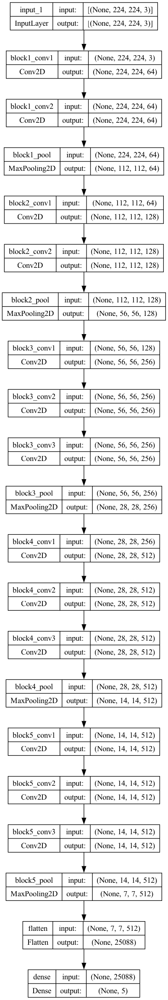

In [30]:
# menampilkan plot architecture model dengan transfer learning
tf.keras.utils.plot_model(model_tl, show_shapes=True)

## CNN Model Transfer Learning Evaluation

### CNN Model Transfer Learning Loss & Accuracy Plot

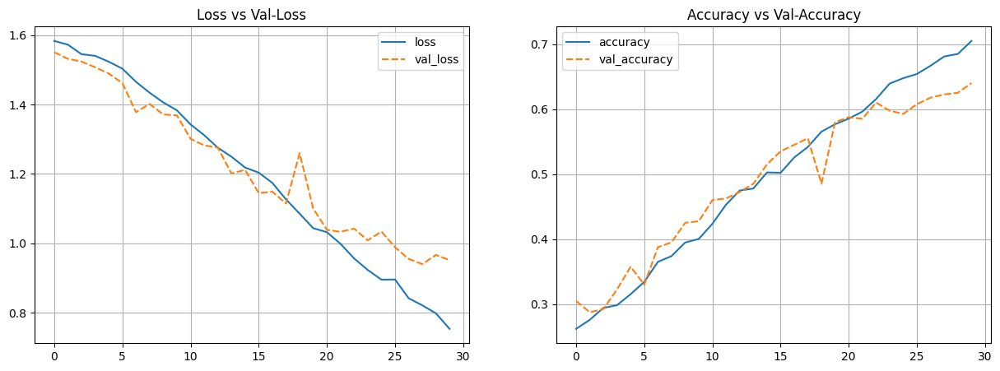

In [123]:
# Plot training results
history_df = pd.DataFrame(history_tl.history)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show()

Berdasarkan output plot diatas, didapatkan insight:
- Nilai loss menunjukkan penurunan yang konsisten pada loss selama pelatihan, yang menandakan model semakin baik mempelajari data.
- Nilai validation loss juga menunjukkan penurunan, namun lebih fluktuatif. Hal ini menunjukkan bahwa performa pada data validasi meningkat meskipun ada beberapa variasi. Tidak ada tanda-tanda overfitting yang signifikan karena val_loss masih mengikuti tren loss dengan cukup baik.
- Nilai akurasi pada training set terus meningkat dengan stabil seiring bertambahnya epoch, menunjukkan model semakin akurat.
- Nilai akurasi validation set juga naik meskipun lebih bervariasi. Ada beberapa fluktuasi, tetapi tren keseluruhan menunjukkan peningkatan akurasi pada data validasi, yang berarti model generalisasinya cukup baik meskipun ada sedikit noise.

`Epoch yang dilakukan hanya sebanyak 30, dan dirasa masih bisa menunjukkan performa yang lebih optimal, sehingga selanjutnya dilakukan training ulang sebanyak 60 epoch dengan hyperparameter yang sama seperti sebelumnya dan menggunakan checkpoint per 5 epoch, karena jika melakukan training menggunakan epoch keseluruhan secara langsung sering terjadi error pada laptop seperti yang terjadi pada model dengan 30 epoch dan terjadi crash lalu laptop melakukan restart beberapa kali`

In [9]:
# define path untuk menyimpan checkpoint 1
checkpoint_path =  "/Users/ciputrawangsa/Documents/checkpoint/cp_1.h5"

# menyimpan checkpoint 1
checkpoint_callback_first = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, save_weights_only=False)
if os.path.exists(checkpoint_path):
    model_tl.load_weights(checkpoint_path)

In [10]:
# training model 
history_tl2 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=5,
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_first])

Epoch 1/5


2024-10-06 01:49:21.683206: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


113/113 [==============================] - ETA: 0s - loss: 3.0656 - accuracy: 0.2083

2024-10-06 01:50:09.680759: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


113/113 [==============================] - 51s 447ms/step - loss: 3.0656 - accuracy: 0.2083 - val_loss: 1.6901 - val_accuracy: 0.1975
Epoch 2/5
113/113 [==============================] - 50s 443ms/step - loss: 1.6496 - accuracy: 0.2325 - val_loss: 1.5974 - val_accuracy: 0.2450
Epoch 3/5
113/113 [==============================] - 50s 443ms/step - loss: 1.6058 - accuracy: 0.2375 - val_loss: 1.5933 - val_accuracy: 0.2475
Epoch 4/5
113/113 [==============================] - 50s 445ms/step - loss: 1.5839 - accuracy: 0.2667 - val_loss: 1.5524 - val_accuracy: 0.2775
Epoch 5/5
113/113 [==============================] - 51s 447ms/step - loss: 1.5565 - accuracy: 0.2847 - val_loss: 1.5227 - val_accuracy: 0.3025


Pada epoch 1-5 menunjukkan informasi:
- nilai accuracy dan val accuracy meningkat perlahan
- nilai loss dan val loss menurun perlahan

In [10]:
# define path untuk menyimpan checkpoint 2
checkpoint_path_2 = "/Users/ciputrawangsa/Documents/checkpoint/cp_2.h5"

# menyimpan checkpoint 2
checkpoint_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_2, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path):
    model_tl.load_weights(checkpoint_path)
    print("Loaded weights from cp_1.h5.")
    last_epoch = 5
else:
    print("Not Found")

Loaded weights from cp_1.h5.


In [12]:
# training model dengan melanjutkan checkpoint 1
history_tl2 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=10,  
    initial_epoch=last_epoch,  
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_first, checkpoint_callback_2])

Epoch 6/10
113/113 [==============================] - 51s 448ms/step - loss: 1.5474 - accuracy: 0.2983 - val_loss: 1.5150 - val_accuracy: 0.3400
Epoch 7/10
113/113 [==============================] - 84s 742ms/step - loss: 1.5304 - accuracy: 0.3078 - val_loss: 1.5017 - val_accuracy: 0.3400
Epoch 8/10
113/113 [==============================] - 51s 446ms/step - loss: 1.5051 - accuracy: 0.3247 - val_loss: 1.4674 - val_accuracy: 0.3400
Epoch 9/10
113/113 [==============================] - 51s 448ms/step - loss: 1.4912 - accuracy: 0.3364 - val_loss: 1.4633 - val_accuracy: 0.3400
Epoch 10/10
113/113 [==============================] - 51s 451ms/step - loss: 1.4549 - accuracy: 0.3442 - val_loss: 1.4278 - val_accuracy: 0.4000


Pada epoch 6-10 menunjukkan informasi:
- Nilai accuracy masih meningkat secara perlahan
- Nilai val accuracy stagnan pada epoch 6-9 dan meningkat pada epoch 10
- Nilai loss dan val loss masih menurun secara perlahan

In [11]:
# define path untuk menyimpan checkpoint 3
checkpoint_path_3 = "/Users/ciputrawangsa/Documents/checkpoint/cp_3.h5"

# menyimpan checkpoint 3
checkpoint_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_3, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_2):
    model_tl.load_weights(checkpoint_path_2)
    print("Loaded weights from cp_2.h5.")
    last_epoch = 10
else:
    print("Not Found")

Loaded weights from cp_2.h5.


In [14]:
# training model dengan melanjutkan checkpoint 2
history_tl3 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=15,  
    initial_epoch=last_epoch,  # Set the starting epoch
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_2, checkpoint_callback_3])

Epoch 11/15
113/113 [==============================] - 51s 450ms/step - loss: 1.4335 - accuracy: 0.3831 - val_loss: 1.3889 - val_accuracy: 0.3975
Epoch 12/15
113/113 [==============================] - 51s 447ms/step - loss: 1.4221 - accuracy: 0.3856 - val_loss: 1.3708 - val_accuracy: 0.4175
Epoch 13/15
113/113 [==============================] - 51s 449ms/step - loss: 1.3879 - accuracy: 0.4047 - val_loss: 1.4009 - val_accuracy: 0.3775
Epoch 14/15
113/113 [==============================] - 51s 450ms/step - loss: 1.3532 - accuracy: 0.4256 - val_loss: 1.3229 - val_accuracy: 0.4575
Epoch 15/15
113/113 [==============================] - 51s 452ms/step - loss: 1.3387 - accuracy: 0.4314 - val_loss: 1.3510 - val_accuracy: 0.4275


Pada epoch 11-15 menunjukkan informasi:
- Nilai val accuracy dan val loss mengalami fluktuasi score
- Nilai loss masih menurun secara perlahan
- nilai accuracy masih meningkat secara perlahan

In [12]:
# define path untuk menyimpan checkpoint 4
checkpoint_path_4 = "/Users/ciputrawangsa/Documents/checkpoint/cp_4.h5"

# menyimpan checkpoint 4
checkpoint_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_4, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_3):
    model_tl.load_weights(checkpoint_path_3)
    print("Loaded weights from cp_3.h5.")
    last_epoch = 15
else:
    print("Not Found")

Loaded weights from cp_3.h5.


In [16]:
# training model dengan melanjutkan checkpoint 3
history_tl4 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=20,  
    initial_epoch=last_epoch,
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_3, checkpoint_callback_4])

Epoch 16/20
113/113 [==============================] - 51s 448ms/step - loss: 1.3069 - accuracy: 0.4444 - val_loss: 1.3123 - val_accuracy: 0.4475
Epoch 17/20
113/113 [==============================] - 51s 445ms/step - loss: 1.2731 - accuracy: 0.4667 - val_loss: 1.2730 - val_accuracy: 0.4600
Epoch 18/20
113/113 [==============================] - 51s 447ms/step - loss: 1.2444 - accuracy: 0.4939 - val_loss: 1.2830 - val_accuracy: 0.5075
Epoch 19/20
113/113 [==============================] - 51s 452ms/step - loss: 1.2255 - accuracy: 0.4936 - val_loss: 1.2219 - val_accuracy: 0.5125
Epoch 20/20
113/113 [==============================] - 51s 451ms/step - loss: 1.1888 - accuracy: 0.5153 - val_loss: 1.1914 - val_accuracy: 0.4950


pada epoch 16-20 menunjukkan informasi:
- Nilai loss masih menurun secara perlahan
- Nilai accuracy meningkat dan terjadi sedikit penurunan pada epoch 19 dan meningkat kembali pada epoch 20
- Nilai val loss dan val accuracy mengalami fluktuasi namun scorenya lebih baik dibandingkan nilai di checkpoint sebelumnya

In [13]:
# define path untuk menyimpan checkpoint 5
checkpoint_path_5 = "/Users/ciputrawangsa/Documents/checkpoint/cp_5.h5"

# menyimpan checkpoint 5
checkpoint_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_5, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_4):
    model_tl.load_weights(checkpoint_path_4)
    print("Loaded weights from cp_4.h5.")
    last_epoch = 20
else:
    print("Not Found")

Loaded weights from cp_4.h5.


In [15]:
# training model dengan melanjutkan checkpoint 4
history_tl5 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=25,  
    initial_epoch=last_epoch,
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_4, checkpoint_callback_5])

Epoch 21/25


2024-10-06 02:45:11.665362: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


113/113 [==============================] - ETA: 0s - loss: 1.0628 - accuracy: 0.5783

2024-10-06 02:45:59.664448: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


113/113 [==============================] - 51s 448ms/step - loss: 1.0628 - accuracy: 0.5783 - val_loss: 1.1052 - val_accuracy: 0.5500
Epoch 22/25
113/113 [==============================] - 51s 446ms/step - loss: 1.0024 - accuracy: 0.5992 - val_loss: 1.1341 - val_accuracy: 0.5200
Epoch 23/25
113/113 [==============================] - 51s 449ms/step - loss: 0.9779 - accuracy: 0.6175 - val_loss: 1.0612 - val_accuracy: 0.5925
Epoch 24/25
113/113 [==============================] - 51s 451ms/step - loss: 0.9335 - accuracy: 0.6364 - val_loss: 1.0948 - val_accuracy: 0.5800
Epoch 25/25
113/113 [==============================] - 281s 2s/step - loss: 0.9268 - accuracy: 0.6342 - val_loss: 1.0233 - val_accuracy: 0.6075


pada epoch 21-25 menunjukkan informasi:
- Nilai loss masih menurun secara perlahan
- Nilai accuracy meningkat dan terjadi sedikit penurunan pada epoch 25
- Nilai val loss dan val accuracy mengalami fluktuasi namun scorenya lebih baik dibandingkan nilai di checkpoint sebelumnya

In [14]:
# define path untuk menyimpan checkpoint 6
checkpoint_path_6 = "/Users/ciputrawangsa/Documents/checkpoint/cp_6.h5"

# menyimpan checkpoint 5
checkpoint_callback_6 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_6, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_5):
    model_tl.load_weights(checkpoint_path_5)
    print("Loaded weights from cp_5.h5.")
    last_epoch = 25
else:
    print("Not Found")

Loaded weights from cp_5.h5.


In [17]:
# training model dengan melanjutkan checkpoint 5
history_tl6 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=30,  
    initial_epoch=last_epoch,
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_5, checkpoint_callback_6])

Epoch 26/30
113/113 [==============================] - 51s 447ms/step - loss: 0.9123 - accuracy: 0.6478 - val_loss: 0.9867 - val_accuracy: 0.6250
Epoch 27/30
113/113 [==============================] - 50s 445ms/step - loss: 0.8483 - accuracy: 0.6711 - val_loss: 0.9670 - val_accuracy: 0.6450
Epoch 28/30
113/113 [==============================] - 51s 445ms/step - loss: 0.8215 - accuracy: 0.6764 - val_loss: 0.9779 - val_accuracy: 0.6250
Epoch 29/30
113/113 [==============================] - 51s 448ms/step - loss: 0.8174 - accuracy: 0.6867 - val_loss: 0.9824 - val_accuracy: 0.6300
Epoch 30/30
113/113 [==============================] - 51s 449ms/step - loss: 0.7846 - accuracy: 0.6997 - val_loss: 0.9848 - val_accuracy: 0.6375


Pada epoch 26-30 menunjukkan informasi:
- Nilai loss masih menurun secara perlahan
- Nilai accuracy meningkat secara perlahan
- Nilai val loss dan val accuracy mengalami fluktuasi namun scorenya lebih baik dibandingkan nilai di checkpoint sebelumnya

In [15]:
# define path untuk menyimpan checkpoint 7
checkpoint_path_7 = "/Users/ciputrawangsa/Documents/checkpoint/cp_7.h5"

# menyimpan checkpoint 7
checkpoint_callback_7 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_7, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_6):
    model_tl.load_weights(checkpoint_path_6)
    print("Loaded weights from cp_6.h5.")
    last_epoch = 30
else:
    print("Not Found")

Loaded weights from cp_6.h5.


In [19]:
# training model dengan melanjutkan checkpoint 6
history_tl7 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=35,  
    initial_epoch=last_epoch,  
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_6, checkpoint_callback_7])

Epoch 31/35
113/113 [==============================] - 51s 449ms/step - loss: 0.7296 - accuracy: 0.7231 - val_loss: 0.9498 - val_accuracy: 0.6575
Epoch 32/35
113/113 [==============================] - 51s 446ms/step - loss: 0.7204 - accuracy: 0.7292 - val_loss: 0.9814 - val_accuracy: 0.6350
Epoch 33/35
113/113 [==============================] - 51s 446ms/step - loss: 0.6921 - accuracy: 0.7392 - val_loss: 0.9912 - val_accuracy: 0.6125
Epoch 34/35
113/113 [==============================] - 51s 448ms/step - loss: 0.6722 - accuracy: 0.7436 - val_loss: 0.9475 - val_accuracy: 0.6600
Epoch 35/35
113/113 [==============================] - 51s 449ms/step - loss: 0.6605 - accuracy: 0.7536 - val_loss: 0.9778 - val_accuracy: 0.6275


Pada epoch 31-35 menunjukkan informasi:
- Nilai loss masih menurun secara perlahan
- Nilai accuracy meningkat secara perlahan
- Nilai val loss dan val accuracy mengalami fluktuasi namun scorenya lebih baik dibandingkan nilai di checkpoint sebelumnya

In [16]:
# define path untuk menyimpan checkpoint 8
checkpoint_path_8 = "/Users/ciputrawangsa/Documents/checkpoint/cp_8.h5"

# menyimpan checkpoint 8
checkpoint_callback_8 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_8, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_7):
    model_tl.load_weights(checkpoint_path_7)
    print("Loaded weights from cp_7.h5.")
    last_epoch = 35
else:
    print("Not Found")

Loaded weights from cp_7.h5.


In [23]:
# training model dengan melanjutkan checkpoint 7
history_tl8 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=40,  
    initial_epoch=last_epoch,  
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_7, checkpoint_callback_8])

Epoch 36/40
113/113 [==============================] - 51s 448ms/step - loss: 0.5576 - accuracy: 0.7917 - val_loss: 0.9385 - val_accuracy: 0.6650
Epoch 37/40
113/113 [==============================] - 51s 447ms/step - loss: 0.5313 - accuracy: 0.8047 - val_loss: 0.7929 - val_accuracy: 0.7025
Epoch 38/40
113/113 [==============================] - 51s 450ms/step - loss: 0.5300 - accuracy: 0.8072 - val_loss: 0.8351 - val_accuracy: 0.6750
Epoch 39/40
113/113 [==============================] - 51s 450ms/step - loss: 0.4796 - accuracy: 0.8242 - val_loss: 0.8477 - val_accuracy: 0.6900
Epoch 40/40
113/113 [==============================] - 51s 451ms/step - loss: 0.4683 - accuracy: 0.8350 - val_loss: 0.9073 - val_accuracy: 0.6575


Pada epoch 36-40 menunjukkan informasi:
- Nilai loss masih menurun secara perlahan
- Nilai accuracy meningkat secara perlahan
- Nilai val loss dan val accuracy mengalami fluktuasi

In [17]:
# define path untuk menyimpan checkpoint 9
checkpoint_path_9 = "/Users/ciputrawangsa/Documents/checkpoint/cp_9.h5"

# menyimpan checkpoint 9
checkpoint_callback_9 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_9, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_8):
    model_tl.load_weights(checkpoint_path_8)
    print("Loaded weights from cp_8.h5.")
    last_epoch = 40
else:
    print("Not Found")

Loaded weights from cp_8.h5.


In [29]:
# training model dengan melanjutkan checkpoint 8
history_tl9 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=45,  
    initial_epoch=last_epoch, 
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_8, checkpoint_callback_9])

Epoch 41/45
113/113 [==============================] - 51s 447ms/step - loss: 0.4283 - accuracy: 0.8403 - val_loss: 0.8691 - val_accuracy: 0.6950
Epoch 42/45
113/113 [==============================] - 51s 445ms/step - loss: 0.4222 - accuracy: 0.8439 - val_loss: 0.8849 - val_accuracy: 0.6625
Epoch 43/45
113/113 [==============================] - 50s 444ms/step - loss: 0.4131 - accuracy: 0.8528 - val_loss: 0.8853 - val_accuracy: 0.6575
Epoch 44/45
113/113 [==============================] - 50s 444ms/step - loss: 0.4393 - accuracy: 0.8353 - val_loss: 0.8863 - val_accuracy: 0.6875
Epoch 45/45
113/113 [==============================] - 51s 446ms/step - loss: 0.4072 - accuracy: 0.8564 - val_loss: 0.9593 - val_accuracy: 0.6825


Pada epoch 40-45 menunjukkan informasi:
- Nilai loss mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya
- Nilai accuracy mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya
- Nilai val loss mengalami sedikit peningkatan
- Nilai val accuracy mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya

In [18]:
# define path untuk menyimpan checkpoint 10
checkpoint_path_10 = "/Users/ciputrawangsa/Documents/checkpoint/cp_10.h5"

# menyimpan checkpoint 10
checkpoint_callback_10 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_10, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_9):
    model_tl.load_weights(checkpoint_path_9)
    print("Loaded weights from cp_9.h5.")
    last_epoch = 45
else:
    print("Not Found")

Loaded weights from cp_9.h5.


In [19]:
# training model dengan melanjutkan checkpoint 9
history_tl10 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=50,  
    initial_epoch=last_epoch, 
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_9, checkpoint_callback_10])

Epoch 46/50


2024-10-06 03:53:20.010435: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


113/113 [==============================] - ETA: 0s - loss: 0.2568 - accuracy: 0.9072

2024-10-06 03:54:08.033600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


113/113 [==============================] - 51s 449ms/step - loss: 0.2568 - accuracy: 0.9072 - val_loss: 0.8828 - val_accuracy: 0.7150
Epoch 47/50
113/113 [==============================] - 51s 449ms/step - loss: 0.2878 - accuracy: 0.8944 - val_loss: 0.8247 - val_accuracy: 0.7350
Epoch 48/50
113/113 [==============================] - 51s 448ms/step - loss: 0.2757 - accuracy: 0.8978 - val_loss: 0.8127 - val_accuracy: 0.7300
Epoch 49/50
113/113 [==============================] - 51s 451ms/step - loss: 0.2467 - accuracy: 0.9133 - val_loss: 0.8680 - val_accuracy: 0.7175
Epoch 50/50
113/113 [==============================] - 51s 452ms/step - loss: 0.2363 - accuracy: 0.9208 - val_loss: 0.7488 - val_accuracy: 0.7600


Pada epoch 46-50 menunjukkan informasi:
- Nilai loss mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya
- Nilai accuracy mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya
- Nilai val loss mengalami fluktuasi
- Nilai val accuracy mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya

In [21]:
# define path untuk menyimpan checkpoint 11
checkpoint_path_11 = "/Users/ciputrawangsa/Documents/checkpoint/cp_11.h5"

# menyimpan checkpoint 11
checkpoint_callback_11 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_11, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_10):
    model_tl.load_weights(checkpoint_path_10)
    print("Loaded weights from cp_10.h5.")
    last_epoch = 50
else:
    print("Not Found")

Loaded weights from cp_10.h5.


In [22]:
# training model dengan melanjutkan checkpoint 10
history_tl11 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=55,  
    initial_epoch=last_epoch,  # Set the starting epoch
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_10, checkpoint_callback_11])

Epoch 51/55
113/113 [==============================] - 51s 451ms/step - loss: 0.2405 - accuracy: 0.9156 - val_loss: 0.7001 - val_accuracy: 0.7600
Epoch 52/55
113/113 [==============================] - 51s 446ms/step - loss: 0.2200 - accuracy: 0.9186 - val_loss: 0.8594 - val_accuracy: 0.7250
Epoch 53/55
113/113 [==============================] - 51s 447ms/step - loss: 0.2085 - accuracy: 0.9281 - val_loss: 0.9119 - val_accuracy: 0.7150
Epoch 54/55
113/113 [==============================] - 51s 447ms/step - loss: 0.2195 - accuracy: 0.9228 - val_loss: 0.8710 - val_accuracy: 0.7225
Epoch 55/55
113/113 [==============================] - 51s 451ms/step - loss: 0.2151 - accuracy: 0.9236 - val_loss: 0.9866 - val_accuracy: 0.6600


Pada epoch 51-55 menunjukkan informasi:
- Nilai loss mengalami fluktuasi namun scorenya masih lebih baik dibandingkan nilai pada checkpoint sebelumnya
- Nilai accuracy mengalami peningkatan secara perlahan
- Nilai val loss mengalami fluktuasi dan meningkat dari checkpoint sebelumnya
- Nilai val accuracy mengalami fluktuasi dan menurun dari checkpoint sebelumnya

In [24]:
# define path untuk menyimpan checkpoint 12
checkpoint_path_12 = "/Users/ciputrawangsa/Documents/checkpoint/cp_12.h5"

# menyimpan checkpoint 12
checkpoint_callback_12 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_12, 
                                                           save_weights_only=False)
if os.path.exists(checkpoint_path_11):
    model_tl.load_weights(checkpoint_path_11)
    print("Loaded weights from cp_11.h5.")
    last_epoch = 55
else:
    print("Not Found")

Loaded weights from cp_11.h5.


In [25]:
# training model dengan melanjutkan checkpoint 11
history_tl12 = model_tl.fit(
    train_set_tl,
    steps_per_epoch=len(train_set_tl),
    epochs=60,  
    initial_epoch=last_epoch,  # Set the starting epoch
    batch_size=32,
    validation_data=val_set_tl,
    validation_steps=len(val_set_tl),
    callbacks=[checkpoint_callback_11, checkpoint_callback_12])

Epoch 56/60
113/113 [==============================] - 51s 448ms/step - loss: 0.1974 - accuracy: 0.9256 - val_loss: 0.7679 - val_accuracy: 0.7575
Epoch 57/60
113/113 [==============================] - 50s 444ms/step - loss: 0.1852 - accuracy: 0.9333 - val_loss: 0.8480 - val_accuracy: 0.7225
Epoch 58/60
113/113 [==============================] - 51s 446ms/step - loss: 0.1964 - accuracy: 0.9328 - val_loss: 0.9776 - val_accuracy: 0.7075
Epoch 59/60
113/113 [==============================] - 51s 448ms/step - loss: 0.1833 - accuracy: 0.9325 - val_loss: 0.8563 - val_accuracy: 0.7175
Epoch 60/60
113/113 [==============================] - 51s 449ms/step - loss: 0.1928 - accuracy: 0.9328 - val_loss: 0.8675 - val_accuracy: 0.7450


Pada epoch 55-60 menunjukkan informasi:
- Nilai loss mengalami fluktuasi namun nilainya lebih baik dibandingkan checkpoint sebelumnya
- Nilai accuracy mengalami fluktuasi namun nilainya lebih baik dibandingkan checkpoint sebelumnya
- Nilai val loss mengalami fluktuasi namun nilainya lebih baik dibandingkan checkpoint sebelumnya
- Nilai val accuracy mengalami fluktuasi namun nilainya lebih baik dibandingkan checkpoint sebelumnya

In [26]:
# define direktori dan path file checkpoint
checkpoint_dir = "/Users/ciputrawangsa/Documents/checkpoint/"
checkpoints = ["cp_1.h5", "cp_2.h5", "cp_3.h5", "cp_4.h5", "cp_5.h5", "cp_6.h5", "cp_7.h5", "cp_8.h5", "cp_9.h5","cp_10.h5", "cp_11.h5", "cp_12.h5"]

best_model = None
best_accuracy = 0.0 

# looping untuk menampilkan score masing-masing checkpoint
for checkpoint in checkpoints:
    checkpoint_path = os.path.join(checkpoint_dir, checkpoint)
    model_tl.load_weights(checkpoint_path)

    # evaluasi score train set dan validation set
    loss, accuracy = model_tl.evaluate(val_set_tl)
    print(f"Checkpoint: {checkpoint}, Accuracy: {accuracy:.4f}")

    # cek best model
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = checkpoint_path

# menampilkan best score ada di checkpoint ke berapa
print(f"Best model found at: {best_model} with accuracy: {best_accuracy:.4f}")


13/13 [==============================] - 3s 196ms/step - loss: 1.4354 - accuracy: 0.3475
Checkpoint: cp_1.h5, Accuracy: 0.3475
13/13 [==============================] - 3s 186ms/step - loss: 1.3159 - accuracy: 0.4500
Checkpoint: cp_2.h5, Accuracy: 0.4500
13/13 [==============================] - 3s 185ms/step - loss: 1.2074 - accuracy: 0.4950
Checkpoint: cp_3.h5, Accuracy: 0.4950
13/13 [==============================] - 3s 187ms/step - loss: 1.0063 - accuracy: 0.5800
Checkpoint: cp_4.h5, Accuracy: 0.5800
13/13 [==============================] - 3s 184ms/step - loss: 0.8952 - accuracy: 0.6600
Checkpoint: cp_5.h5, Accuracy: 0.6600
13/13 [==============================] - 3s 187ms/step - loss: 0.9237 - accuracy: 0.6350
Checkpoint: cp_6.h5, Accuracy: 0.6350
13/13 [==============================] - 3s 192ms/step - loss: 0.8124 - accuracy: 0.6850
Checkpoint: cp_7.h5, Accuracy: 0.6850
13/13 [==============================] - 3s 189ms/step - loss: 0.9664 - accuracy: 0.6675
Checkpoint: cp_8.h5, A

Dari hasil training dengan 60 menggunakan checkpoint didapatkan informasi:
- terjadi peningkatan bertahap pada akurasi seiring waktu. Pada checkpoint pertama, akurasi model berada pada 0.3475 dengan loss 1.4354, menandakan model masih dalam tahap awal pembelajaran.
- Pada checkpoint kedua dan seterusnya, akurasi terus meningkat, dari 0.4500 hingga mencapai 0.7400 pada checkpoint ke-9, yang merupakan performa terbaik dari model ini.
- Setelah checkpoint ke-9, performa model sedikit berfluktuasi, tetapi tidak mencapai akurasi lebih tinggi dari 0.7400.
- Model terbaik ditemukan pada checkpoint cp_9.h5 dengan akurasi 0.7400, dan ini diidentifikasi sebagai checkpoint dengan performa tertinggi.

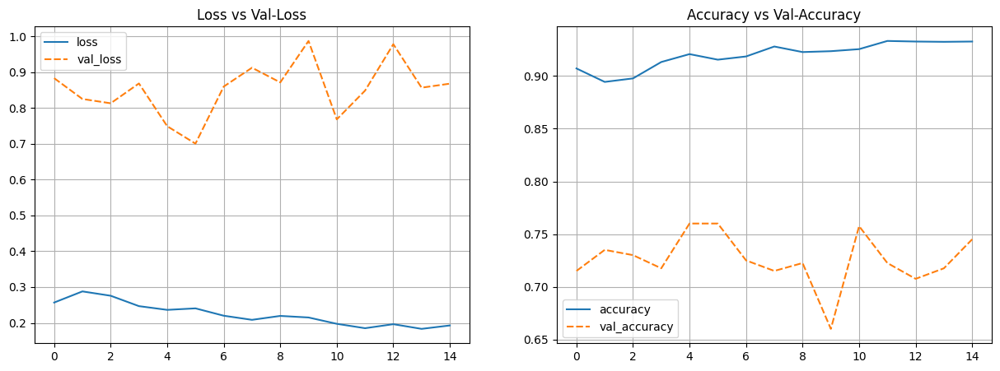

In [40]:
# membuat dataframe history training dari 3 model terakhir
history_df_10 = pd.DataFrame(history_tl10.history)
history_df_11 = pd.DataFrame(history_tl11.history)
history_df_12 = pd.DataFrame(history_tl12.history)

# concat dataframe
history_df_tl = pd.concat([history_df_10, history_df_11, history_df_12], ignore_index=True)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df_tl[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df_tl[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show() 

*Pada saat training dari checkpoint 9 terjadi error pada laptop sehingga history model hanya tersimpan dari training ke 10-12, sudah mencari informasi dan referensi terkait menampilkan history dari hasil penyimpanan checkpoint menggunakan format .h5 tetapi tidak ditemukan, sehingga terpaksa hanya menampilkan 15 epoch terakhir sebagai gambaran plot model*

Dari plot diatas didapatkan informasi:
- Nilai loss di training set menunjukkan tren yang stabil dan terus menurun hingga mencapai nilai yang sangat rendah, yang menunjukkan model belajar dengan baik pada data pelatihan.
- Nilai val loss di validation set sangat fluktuatif, dengan beberapa puncak dan lembah yang signifikan. Meskipun ada sedikit penurunan secara keseluruhan, fluktuasi ini menunjukkan bahwa model mungkin mengalami kesulitan untuk generalisasi yang baik pada data validasi. Tetapi masih lebih baik dibandingkan dengan model-model sebelumnya.
- Nilai accuracy stabil dan tetap tinggi, mencapai lebih dari 90%, menunjukkan bahwa model sangat akurat pada data pelatihan.
- Nilai val accuracy juga menunjukkan fluktuasi yang signifikan, yang berarti model memiliki performa yang tidak konsisten pada data validasi. Meskipun pada beberapa titik val accuracy mendekati 80%, ada beberapa penurunan tajam yang mengindikasikan overfitting atau masalah pada generalisasi.

## CNN Model Transfer Learning Predict

### CNN Model Transfer Learning Classification Report Evaluation

In [41]:
# predict test set
y_pred_prob = model_tl.predict(test_set_tl)

# mengklasifikasikan class berdasarkan nilai proba terbesar
y_pred_class = np.argmax(y_pred_prob, axis=-1)

# menampilkan classification report
print(classification_report(test_set_tl.classes, y_pred_class, target_names=np.array(list(train_set_tl.class_indices.keys()))))

 1/32 [..............................] - ETA: 14s

2024-10-06 04:54:44.655668: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 6s 190ms/step
              precision    recall  f1-score   support

       Heart       0.76      0.60      0.67       200
      Oblong       0.66      0.86      0.74       200
        Oval       0.63      0.51      0.56       200
       Round       0.77      0.65      0.70       199
      Square       0.66      0.83      0.74       200

    accuracy                           0.69       999
   macro avg       0.70      0.69      0.68       999
weighted avg       0.70      0.69      0.68       999



Hasil evaluasi menunjukkan bahwa akurasi keseluruhan model adalah 0.69 atau 69%. Ini berarti model mampu memprediksi dengan benar 69% dari total 999 sampel yang diuji. Akurasi ini mengindikasikan bahwa model cukup baik, namun masih ada ruang untuk peningkatan dalam mengenali pola pada data secara lebih tepat, terutama untuk kategori tertentu yang performanya kurang stabil. Hasilnya lebih baik dibandingkan model-model sebelumnya.

### CNN Model Transfer Learning Confusion Matrix Evaluation

32/32 [==============================] - 6s 188ms/step


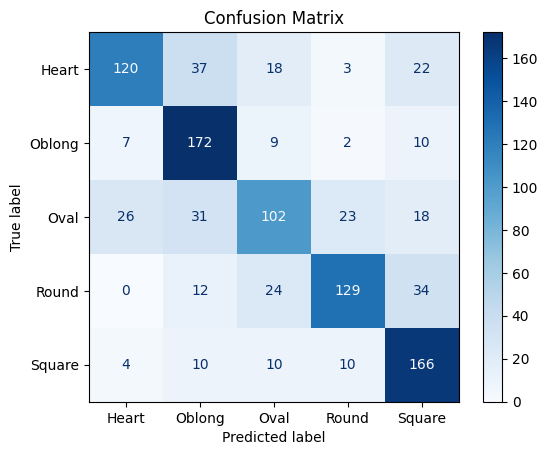

In [42]:
# mendapatkan label asli dari dataset test
y_true_labels = test_set_tl.classes

# membuat confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_class)

# menampilkan confusion matrix dalam bentuk plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set_tl.class_indices.keys())
disp.plot(cmap=plt.cm.Blues) 

plt.title('Confusion Matrix')
plt.show()


Insight:
- Heart:
    Prediksi benar: 120 dari 200 sampel.
    Kesalahan paling banyak terjadi ketika Heart diprediksi sebagai Oblong (37 kali).

- Oblong:
    Prediksi benar: 172 dari 200 sampel, performa yang sangat baik.
    Kesalahan kecil terutama terjadi pada Heart (7 kali).

- Oval:
    Prediksi benar: 102 dari 200 sampel, menunjukkan kesulitan model dalam mengklasifikasikan bentuk Oval.
    Kesalahan paling sering terjadi pada Oblong dan Heart.

- Round:
    Prediksi benar: 129 dari 199 sampel.
    Kesalahan paling sering terjadi pada Square (34 kali).

- Square:
    Prediksi benar: 166 dari 200 sampel.
    Kesalahan terbesar pada Round (10 kali).

Secara keseluruhan model dengan transfer learning sudah cukup baik dalam melakukan prediksi class untuk dataset ini, namun masih bisa dioptimalkan lagi dengan trial error tunin layer dan hyperparameternya.

# Model Saving

In [37]:
#save model
model_tl.save('model.h5')

# Pengambilan Keputusan

Berdasarkan beberapa model yang sudah diuji sebelumnya (base model, model improvement dan model dengan transfer learning), model yang akan dipilih adalah model dengan menggunakan transfer learning dari VGG16 dengan arsitektur sequential API. Walaupun kesalahan prediksi yang akan terjadi sebesar 30%, namun hal ini akan cukup membantu dalam pengembangan bisnis dan menyediakan fasilitas yang akan digunakan berdasarkan performa dari model ini.

**Rekomendasi:**
- Model sering salah dalam mengklasifikasikan Oval, dengan banyaknya prediksi yang keliru ke kelas lain seperti 0blong dan heart. Jadi harus memperbaiki representasi fitur atau menambah data pelatihan untuk oval guna meningkatkan akurasi prediksinya.
- Ada kesalahan prediksi signifikan antara kelas heart dan oblong, serta antara round dan square. Ini mungkin menunjukkan bahwa fitur yang dipakai kurang membedakan antara bentuk-bentuk ini. Mungkin perlu dilakukan eksplorasi lebih lanjut pada ekstraksi fitur atau penambahan fitur yang lebih relevan untuk membedakan kelas tersebut.
- Untuk kategori dengan banyak kesalahan prediksi, seperti oval dan round, penambahan data pelatihan atau melakukan augmentasi data sepertinya bisa meningkatkan performa model.
- Meskipun performa model cukup baik pada beberapa kategori, tuning hyperparameter tambahan atau eksperimen dengan arsitektur yang berbeda bisa meningkatkan akurasi keseluruhan.